# Test out segmentation algorithms

In [1]:
from pyclouds.imports import *
from pyclouds.helpers import wh2xy
from pyclouds.zooniverse import *
from PIL import Image
from tqdm import tqdm_notebook as tqdm
import pickle
from itertools import combinations

## Is there a lot of overlap for classifications made by one user?

In [2]:
annos_full = pd.read_csv('/local/S.Rasp/tmp/annos_full.csv', index_col=0)

In [3]:
len(annos_full)

49132

In [4]:
SSDDIR = '/local/S.Rasp/cloud-classification/'

In [5]:
def plot_img_with_annos(subj_id, user=None):
    l2c = {'Sugar': [241, 244, 66], 'Flower': [244, 65, 65], 'Fish': [65, 241, 244], 'Gravel':[73, 244, 65]}
    fig, ax = plt.subplots(figsize=(15, 10))
    fn = str(SSDDIR + subj[subj.subject_id == subj_id].iloc[0]['fn'])
    img = Image.open(fn)
    ax.imshow(img)
    ans = annos_full[annos_full.subject_ids == subj_id]
    if user is not None: ans = ans[ans.user_name == user]
    nones = []
    for i, a in ans.iterrows():
        if np.isfinite(a['x']):
            rect = patches.Rectangle((a['x'],a['y']), a['width'], a['height'], facecolor='none', 
                                     edgecolor=np.array(l2c[a['tool_label']])/255, lw=2)
            ax.add_patch(rect)
            ax.text(a['x'], a['y'], a['tool_label'] + ' - ' + a['user_name'], color=(0,1,0), fontsize=15, va='top')
        else:
            nones.append(a['user_name'])
    if len(nones) > 0:
        ax.text(0, -50, 'None: ' + str(nones), color='red', fontsize=15, va='top')

In [6]:
subj_fn = '../zooniverse_raw/sugar-flower-fish-or-gravel-subjects_18_11_05.csv'

In [7]:
subj = load_classifications(subj_fn)

In [8]:
subj = subj[subj.subject_set_id.apply(lambda s: s in subj_id2name.keys())]

In [9]:
subj['fn'] = subj.metadata.apply(lambda x: x['fn'][48:])

In [10]:
len(subj)

9984

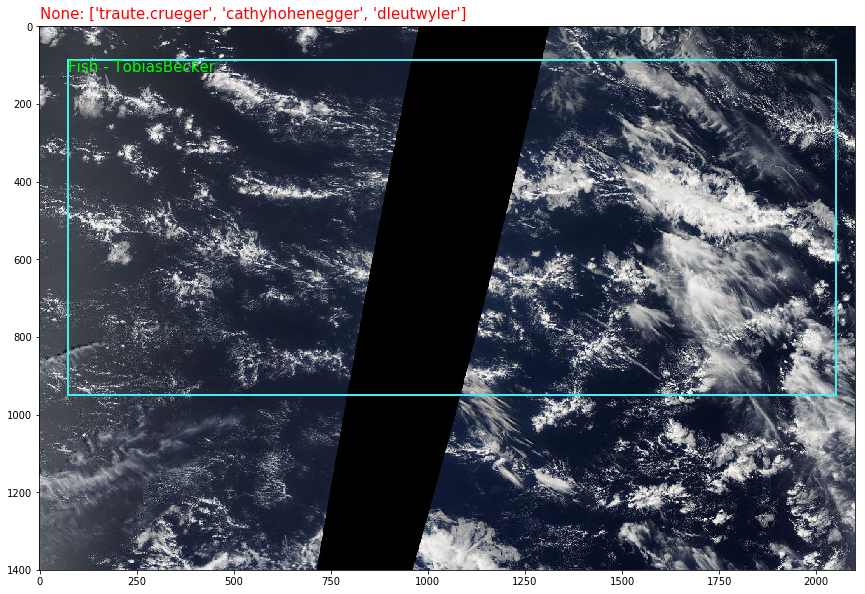

In [11]:
s = subj.subject_id.iloc[np.random.randint(0, len(subj))]
plot_img_with_annos(s)

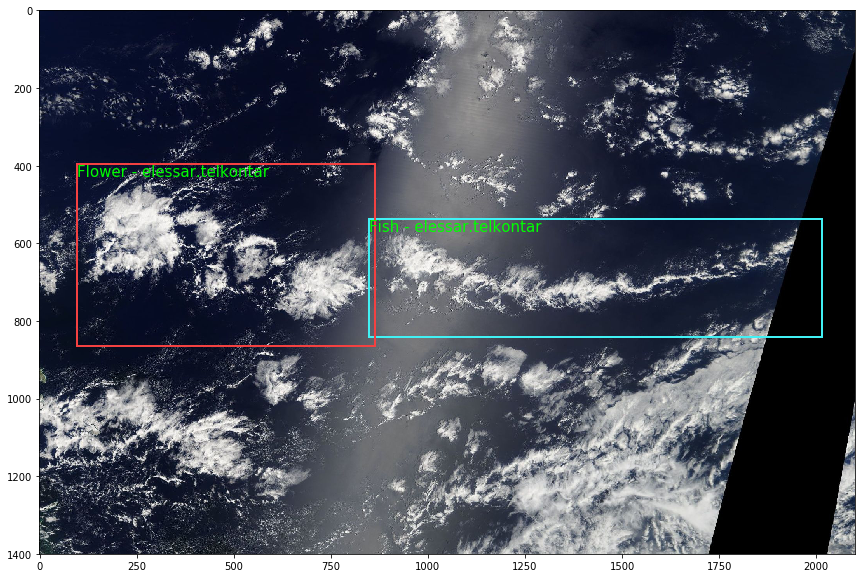

In [40]:
plot_img_with_annos(s, 'elessar.telkontar')

In [99]:
s

27143175

In [101]:
annos_full[annos_full.subject_ids == s]

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
2976,129706935,onnoq,1834851.0,0d3b3984d0cbc4cfd6aa,8073,Full dataset,13.11,2018-11-02 10:17:32 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-02 10:17:32,427.302246,546.211792,1454.164917,241.105042,Fish,2018-11-02 10:17:04.963,2018-11-02 10:17:32.462
24406,129745514,jan.welss,1837022.0,cb6efbf3c45cf471756d,8073,Full dataset,13.11,2018-11-02 14:24:35 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-02 14:24:35,29.741478,522.725952,2003.723366,328.077087,Fish,2018-11-02 14:24:31.062,2018-11-02 14:24:35.572
27342,129751633,jpmellado,1830430.0,ee0520bf6ea31fa13be0,8073,Full dataset,13.11,2018-11-02 14:49:16 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-02 14:49:16,857.295837,551.226624,1128.660583,304.047424,Fish,2018-11-02 14:49:01.826,2018-11-02 14:49:16.184
27343,129751633,jpmellado,1830430.0,ee0520bf6ea31fa13be0,8073,Full dataset,13.11,2018-11-02 14:49:16 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-02 14:49:16,12.719826,1027.260376,506.745567,325.545654,Gravel,2018-11-02 14:49:01.826,2018-11-02 14:49:16.184
31979,130571441,elessar.telkontar,1836907.0,a0118be7b60aa1c3790e,8073,Full dataset,13.11,2018-11-07 14:31:31 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-07 14:31:31,848.549561,537.153381,1165.996948,303.084595,Fish,2018-11-07 14:31:11.338,2018-11-07 14:31:30.675
31980,130571441,elessar.telkontar,1836907.0,a0118be7b60aa1c3790e,8073,Full dataset,13.11,2018-11-07 14:31:31 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-07 14:31:31,95.355614,395.253113,768.782570,469.584656,Flower,2018-11-07 14:31:11.338,2018-11-07 14:31:30.675


### Statistically, how much overlap is there
It does happen, but seems to be rather rare.

In [52]:
annos_full.tail()

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
49127,136647449,onnoq,1834851.0,af96bca21f888f9ee82c,8073,Full dataset,13.11,2018-12-14 16:10:08 UTC,NaN,NaN,...,R3_SON_Terra,Region3_SON_Terra/Terra_CorrectedReflectance20...,2018-12-14 16:10:08,845.996643,4.319855,1047.748474,577.689545,Sugar,2018-12-14 16:09:52.103,2018-12-14 16:10:05.873
49128,136647449,onnoq,1834851.0,af96bca21f888f9ee82c,8073,Full dataset,13.11,2018-12-14 16:10:08 UTC,NaN,NaN,...,R3_SON_Terra,Region3_SON_Terra/Terra_CorrectedReflectance20...,2018-12-14 16:10:08,48.653328,636.922852,1043.355461,586.475586,Gravel,2018-12-14 16:09:52.103,2018-12-14 16:10:05.873
49129,136647469,onnoq,1834851.0,af96bca21f888f9ee82c,8073,Full dataset,13.11,2018-12-14 16:10:14 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-12-14 16:10:14,NaN,NaN,NaN,NaN,NaN,2018-12-14 16:10:05.895,2018-12-14 16:10:12.173
49130,136647512,onnoq,1834851.0,af96bca21f888f9ee82c,8073,Full dataset,13.11,2018-12-14 16:10:28 UTC,NaN,NaN,...,R3_DJF_Terra,Region3_DJF_Terra/Terra_CorrectedReflectance20...,2018-12-14 16:10:28,1059.060791,254.725189,924.742310,542.544952,Flower,2018-12-14 16:10:12.234,2018-12-14 16:10:26.570
49131,136647512,onnoq,1834851.0,af96bca21f888f9ee82c,8073,Full dataset,13.11,2018-12-14 16:10:28 UTC,NaN,NaN,...,R3_DJF_Terra,Region3_DJF_Terra/Terra_CorrectedReflectance20...,2018-12-14 16:10:28,327.613647,202.008270,610.637512,1140.003204,Sugar,2018-12-14 16:10:12.234,2018-12-14 16:10:26.570


In [12]:
clas_ids = annos_full.classification_id.unique(); clas_ids

array([129486316, 129486328, 129486340, ..., 136647449, 136647469,
       136647512])

In [102]:
cid = clas_ids[-1]
cid = 130571441

In [103]:
ans = annos_full[annos_full.classification_id == cid]; ans

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
31979,130571441,elessar.telkontar,1836907.0,a0118be7b60aa1c3790e,8073,Full dataset,13.11,2018-11-07 14:31:31 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-07 14:31:31,848.549561,537.153381,1165.996948,303.084595,Fish,2018-11-07 14:31:11.338,2018-11-07 14:31:30.675
31980,130571441,elessar.telkontar,1836907.0,a0118be7b60aa1c3790e,8073,Full dataset,13.11,2018-11-07 14:31:31 UTC,NaN,NaN,...,BCO_MAM_Terra,Region1_MAM_Terra/Terra_CorrectedReflectance20...,2018-11-07 14:31:31,95.355614,395.253113,768.782570,469.584656,Flower,2018-11-07 14:31:11.338,2018-11-07 14:31:30.675


In [104]:
labels = ans.tool_label.unique(); labels

array(['Fish', 'Flower'], dtype=object)

In [105]:
ans.iloc[0][['x', 'y', 'width', 'height']]

x          848.55
y         537.153
width        1166
height    303.085
Name: 31979, dtype: object

In [106]:
annos1 = [list(r[['x', 'y', 'width', 'height']]) for i, r in ans[ans.tool_label == labels[0]].iterrows()]
annos2 = [list(r[['x', 'y', 'width', 'height']]) for i, r in ans[ans.tool_label == labels[1]].iterrows()]

In [107]:
annos1, annos2

([[848.549560546875,
   537.1533813476561,
   1165.9969482421875,
   303.0845947265625]],
 [[95.3556137084961, 395.2531127929688, 768.7825698852539, 469.5846557617188]])

In [108]:
from pyclouds.iou import *

In [109]:
iou_one_class_from_annos(annos1, annos2, (1400, 2100), return_iou=True)

0.0086918606318954

In [112]:
for a, b in itertools.combinations(['a', 'b', 'c'], 2):
    print(a, b)

a b
a c
b c


In [149]:
tot = 0
overlap = 0
iou_list = []
for cid in tqdm(clas_ids[:10000]):
    ans = annos_full[annos_full.classification_id == cid]
    labels = ans.tool_label.unique()
    ious = []
    for l1, l2 in itertools.combinations(labels, 2):
        annos1 = [list(r[['x', 'y', 'width', 'height']]) for i, r in ans[ans.tool_label == l1].iterrows()]
        annos2 = [list(r[['x', 'y', 'width', 'height']]) for i, r in ans[ans.tool_label == l2].iterrows()]
        iou = iou_one_class_from_annos(annos1, annos2, (2100, 1400), return_iou=True)
        ious.append(iou)
        tot +=1
        if iou > 0: overlap += 1
    iou_list.append(np.max(ious) if len(ious) > 0 else 0)

/home/s/S.Rasp/repositories/cloud-classification/notebooks/pyclouds/iou.py:43: RuntimeWarning: invalid value encountered in long_scalars
  if return_iou:
/home/s/S.Rasp/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


In [150]:
tot, overlap

(4520, 879)

In [151]:
np.nanargmax(iou_list)

6678

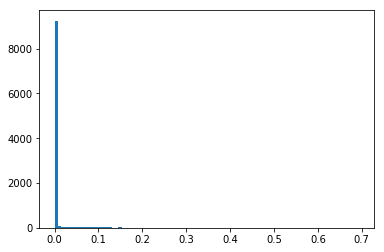

In [152]:
plt.hist(iou_list, bins=100);

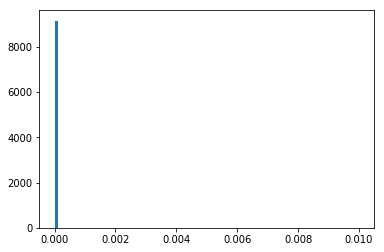

In [153]:
plt.hist(iou_list, range=[0, 0.01], bins=100);

In [154]:
iou_list[6678]

0.6935051086852019

In [155]:
clas_ids[6678]

129721875

In [156]:
annos_full[annos_full.classification_id == 129721875]

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
10740,129721875,geetgeorge,1830662.0,2696cc1d839049f20242,8073,Full dataset,13.11,2018-11-02 12:11:21 UTC,NaN,NaN,...,R3_SON_Terra,Region3_SON_Terra/Terra_CorrectedReflectance20...,2018-11-02 12:11:21,546.158142,250.273666,1552.542297,1156.656998,Flower,2018-11-02 12:10:47.717,2018-11-02 12:11:21.391
10741,129721875,geetgeorge,1830662.0,2696cc1d839049f20242,8073,Full dataset,13.11,2018-11-02 12:11:21 UTC,NaN,NaN,...,R3_SON_Terra,Region3_SON_Terra/Terra_CorrectedReflectance20...,2018-11-02 12:11:21,491.170166,577.681824,1608.378418,818.492859,Fish,2018-11-02 12:10:47.717,2018-11-02 12:11:21.391


In [157]:
annos_full[annos_full.classification_id == 129721875].subject_ids

10740    27163185
10741    27163185
Name: subject_ids, dtype: int64

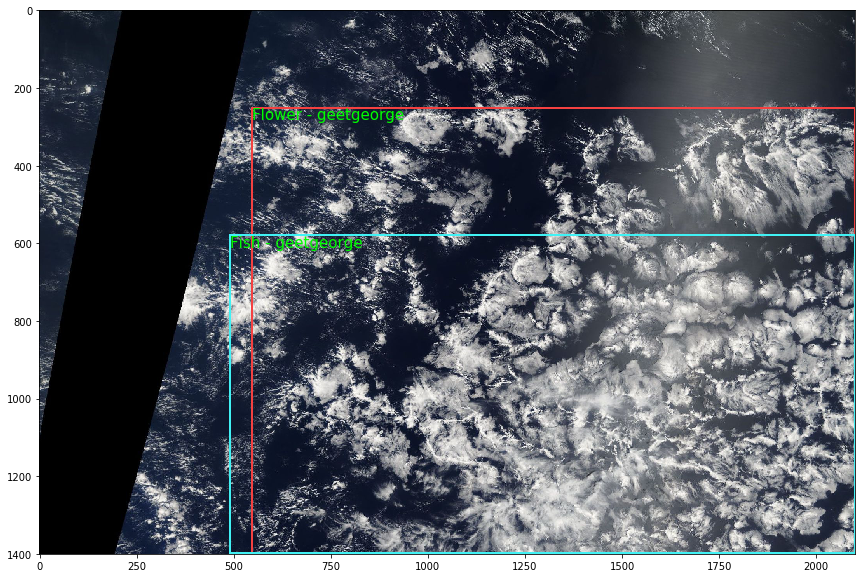

In [159]:
plot_img_with_annos(27163185, 'geetgeorge')

So it is really very rare, but there are outliers!

## Create masks

In [160]:
!du -h $SSDDIR

726M	/local/S.Rasp/cloud-classification/Region1_DJF_Aqua
695M	/local/S.Rasp/cloud-classification/Region1_DJF_Terra
616M	/local/S.Rasp/cloud-classification/Region1_MAM_Aqua
605M	/local/S.Rasp/cloud-classification/Region1_MAM_Terra
697M	/local/S.Rasp/cloud-classification/Region2_DJF_Aqua
674M	/local/S.Rasp/cloud-classification/Region2_DJF_Terra
592M	/local/S.Rasp/cloud-classification/Region3_DJF_Aqua
574M	/local/S.Rasp/cloud-classification/Region3_DJF_Terra
589M	/local/S.Rasp/cloud-classification/Region3_SON_Aqua
572M	/local/S.Rasp/cloud-classification/Region3_SON_Terra
6.0M	/local/S.Rasp/cloud-classification/examples/fish
5.7M	/local/S.Rasp/cloud-classification/examples/flower
34M	/local/S.Rasp/cloud-classification/examples/gravel
3.3M	/local/S.Rasp/cloud-classification/examples/sugar
48M	/local/S.Rasp/cloud-classification/examples
9.1M	/local/S.Rasp/cloud-classification/tutorial-gold-standard
14M	/local/S.Rasp/cloud-classification/tutorial-random
6.3G	/local/S.Rasp/cloud-classification

In [ ]:
ans = 

In [243]:
ans

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
0,129486316,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:28:49 UTC,NaN,NaN,...,BCO_MAM_Aqua,Region1_MAM_Aqua/Aqua_CorrectedReflectance2007...,2018-11-01 08:28:49,190.188187,11.954011,957.533615,490.033599,Sugar,2018-11-01 08:28:37.425,2018-11-01 08:28:49.487


In [196]:
ans.subject_ids

16441    27143967
16442    27143967
Name: subject_ids, dtype: int64

In [167]:
img = Image.open(SSDDIR + ans.fn.iloc[0])

In [168]:
img.size

(2100, 1400)

In [169]:
mask = np.zeros(img.size, dtype=int)

In [183]:
ans_list = [[list(r[['x', 'y', 'width', 'height']].astype(int)), r['tool_label']] for i, r in ans.iterrows()]

In [184]:
ans_list

[[[427, 118, 944, 594], 'Flower'], [[1687, 640, 397, 422], 'Sugar']]

In [13]:
def size(xywh): return xywh[2] * xywh[3]

In [186]:
[size(l[0]) for l in ans_list]

[560736, 167534]

In [187]:
ans_list.sort(key=lambda x: size(x[0]), reverse=True)

In [188]:
ans_list

[[[427, 118, 944, 594], 'Flower'], [[1687, 640, 397, 422], 'Sugar']]

In [190]:
from pyclouds.helpers import wh2xy

In [14]:
cls2id = {'Sugar': 1, 'Flower': 2, 'Fish': 3, 'Gravel': 4}

In [203]:
for a in ans_list:
    x1, y1, x2, y2 = wh2xy(*a[0])
    mask[x1:x2, y1:y2] = cls2id[a[1]]

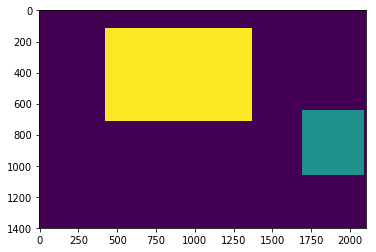

In [204]:
plt.imshow(mask.T)

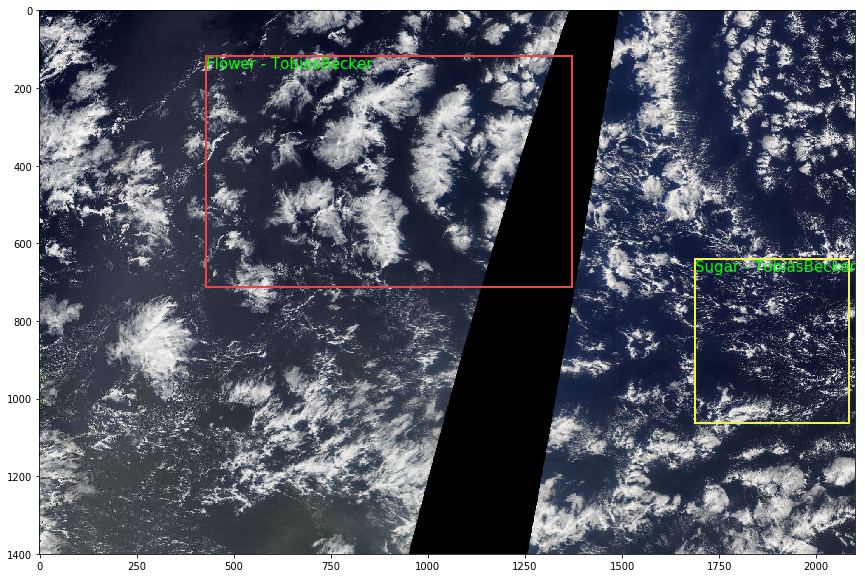

In [197]:
plot_img_with_annos(27143967, 'TobiasBecker')

In [205]:
import scipy

In [217]:
mask.dtype

dtype('int64')

In [227]:
im = Image.fromarray(mask.astype(np.int8).T)

In [228]:
im.save('/local/S.Rasp/tmp/im.png')

In [229]:
m = Image.open('/local/S.Rasp/tmp/im.png')

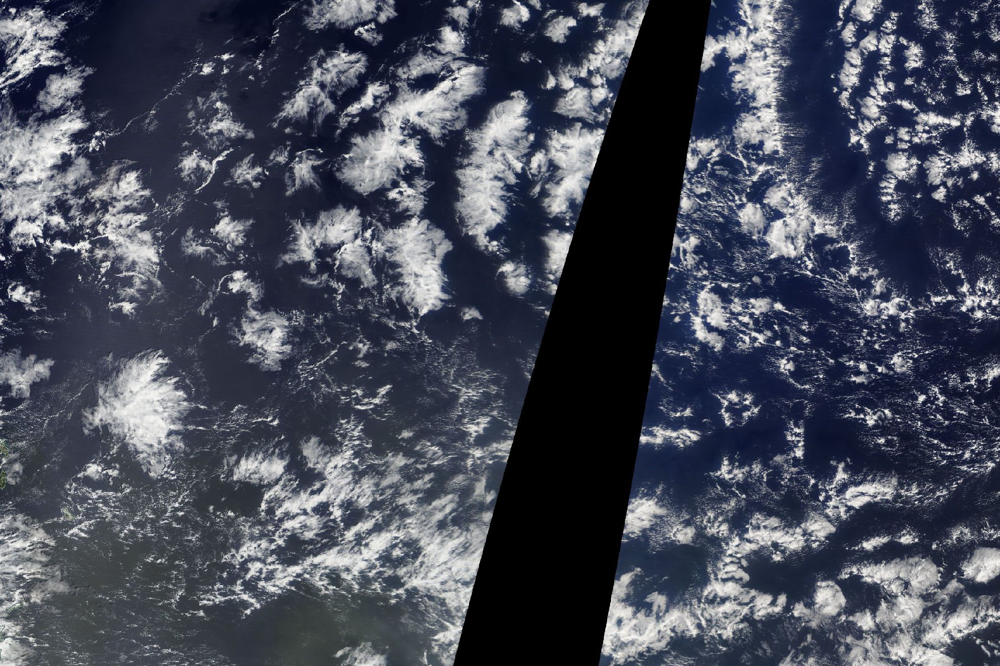

In [224]:
img

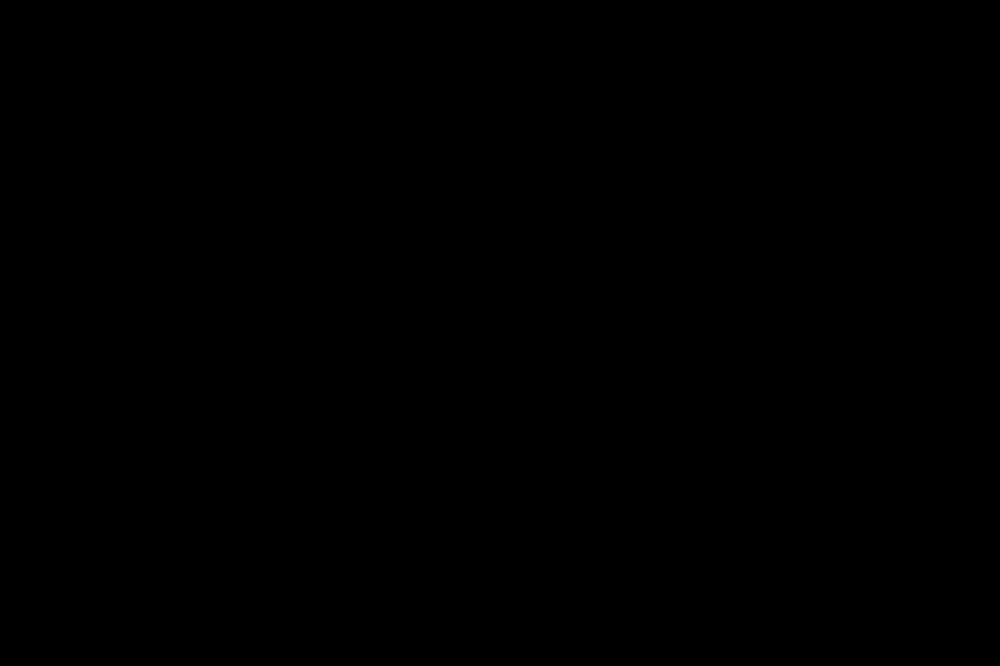

In [230]:
m

In [225]:
img.size

(2100, 1400)

In [226]:
m.size

(1400, 2100)

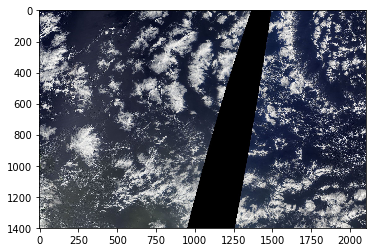

In [232]:
plt.imshow(np.array(img))

## Create masks

In [235]:
classifications = annos_full.classification_id.unique(); classifications

array([129486316, 129486328, 129486340, ..., 136647449, 136647469,
       136647512])

In [236]:
len(classifications)

30310

In [237]:
ans = annos_full[annos_full.classification_id == classifications[0]]

In [240]:
ans.fn.iloc[0]

'Region1_MAM_Aqua/Aqua_CorrectedReflectance20070331_-61--40_10-24.jpeg'

In [242]:
!mkdir $SSDDIR/masks/

In [278]:
img_fns = []
mask_fns = []
for cl in tqdm(classifications):
    ans = annos_full[annos_full.classification_id == cl]
    fn = ans.fn.iloc[0]
    mask_fn = 'masks/' + fn.rstrip('.jpeg') + '_' + str(cl) + '.png'
    img_fns.append(fn); mask_fns.append(mask_fn)
    mask = np.zeros(img.size, dtype=np.int8)
    
    if np.isnan(ans.x.iloc[0]): 
        m = Image.fromarray(mask.astype(np.int8).T)
        m.save(SSDDIR + mask_fn)
        continue
    
    ans_list = [[list(r[['x', 'y', 'width', 'height']].astype(int)), r['tool_label']] for i, r in ans.iterrows()]
    ans_list.sort(key=lambda x: size(x[0]), reverse=True)
    
    for a in ans_list:
        x1, y1, x2, y2 = wh2xy(*a[0])
        mask[x1:x2, y1:y2] = cls2id[a[1]]
    
    m = Image.fromarray(mask.astype(np.int8).T)
    m.save(SSDDIR + mask_fn)

In [279]:
df = pd.DataFrame({'fn': img_fns, 'mask': mask_fns})

In [280]:
df.head()

,fn,mask
0,Region1_MAM_Aqua/Aqua_CorrectedReflectance2007...,masks/Region1_MAM_Aqua/Aqua_CorrectedReflectan...
1,Region3_DJF_Aqua/Aqua_CorrectedReflectance2015...,masks/Region3_DJF_Aqua/Aqua_CorrectedReflectan...
2,Region3_SON_Terra/Terra_CorrectedReflectance20...,masks/Region3_SON_Terra/Terra_CorrectedReflect...
3,Region1_DJF_Aqua/Aqua_CorrectedReflectance2011...,masks/Region1_DJF_Aqua/Aqua_CorrectedReflectan...
4,Region1_DJF_Aqua/Aqua_CorrectedReflectance2011...,masks/Region1_DJF_Aqua/Aqua_CorrectedReflectan...


In [281]:
len(df)

30310

In [283]:
bad_files = ['Region3_SON_Aqua/Aqua_CorrectedReflectance20151003_-135--114_-15--1.jpeg',
 'Region3_SON_Aqua/Aqua_CorrectedReflectance20091028_-135--114_-15--1.jpeg',
 'Region1_MAM_Terra/Terra_CorrectedReflectance20170302_-61--40_10-24.jpeg',
 'Region1_MAM_Terra/Terra_CorrectedReflectance20070512_-61--40_10-24.jpeg',
 'Region1_DJF_Aqua/Aqua_CorrectedReflectance20170221_-61--40_10-24.jpeg',
 'Region2_DJF_Terra/Terra_CorrectedReflectance20071208_159-180_8-22.jpeg',
 'Region3_SON_Aqua/Aqua_CorrectedReflectance20161022_-135--114_-15--1.jpeg',
 'Region3_SON_Terra/Terra_CorrectedReflectance20091021_-135--114_-15--1.jpeg',
 'Region1_DJF_Aqua/Aqua_CorrectedReflectance20130116_-61--40_10-24.jpeg',
 'Region2_DJF_Aqua/Aqua_CorrectedReflectance20101201_159-180_8-22.jpeg',
 'Region1_DJF_Terra/Terra_CorrectedReflectance20070227_-61--40_10-24.jpeg',
 'Region1_MAM_Terra/Terra_CorrectedReflectance20130308_-61--40_10-24.jpeg',
 'Region1_DJF_Aqua/Aqua_CorrectedReflectance20110211_-61--40_10-24.jpeg',
 'Region3_DJF_Terra/Terra_CorrectedReflectance20140123_-135--114_-15--1.jpeg',
 'Region1_DJF_Aqua/Aqua_CorrectedReflectance20071217_-61--40_10-24.jpeg',
 'Region2_DJF_Terra/Terra_CorrectedReflectance20170224_159-180_8-22.jpeg',
 'Region3_DJF_Terra/Terra_CorrectedReflectance20080101_-135--114_-15--1.jpeg',
 'Region3_DJF_Aqua/Aqua_CorrectedReflectance20071218_-135--114_-15--1.jpeg',
 'Region3_DJF_Aqua/Aqua_CorrectedReflectance20071201_-135--114_-15--1.jpeg',
 'Region2_DJF_Terra/Terra_CorrectedReflectance20171213_159-180_8-22.jpeg',
 'Region3_DJF_Aqua/Aqua_CorrectedReflectance20090111_-135--114_-15--1.jpeg',
 'Region1_DJF_Aqua/Aqua_CorrectedReflectance20071207_-61--40_10-24.jpeg',
 'Region3_DJF_Terra/Terra_CorrectedReflectance20070103_-135--114_-15--1.jpeg',
 'Region2_DJF_Terra/Terra_CorrectedReflectance20161220_159-180_8-22.jpeg']

In [284]:
df = df[df.fn.apply(lambda fn: fn not in bad_files)]

In [285]:
len(df)

30236

In [286]:
df.to_csv(SSDDIR+ 'fastai.csv')

## Urgh, create my own Data Generator

In [188]:
import cv2
import tensorflow as tf
from keras_preprocessing.image import load_img, img_to_array

In [247]:
class UNetGenerator(tf.keras.utils.Sequence):

    def __init__(self, path, x_fns, y_fns, batch_size, shuffle=True, size=(2100, 1400)):
        self.path = path
        self.x_fns, self.y_fns = list(x_fns), list(y_fns)
        self.size = tuple(size)
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.n_samples = len(x_fns)

    def __len__(self):
        return int(np.ceil(self.n_samples / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x_fns[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y_fns[idx * self.batch_size:(idx + 1) * self.batch_size]
        
        X = np.array([img_to_array(load_img(self.path + fn, target_size=self.size)) 
                      for fn in batch_x]) / 255.
        Y = np.array([img_to_array(load_img(self.path + fn, color_mode='grayscale', target_size=self.size)) 
                      for fn in batch_y]).astype(np.int8)

        
        return X, Y
    
    def on_epoch_end(self):
        self.indices = np.arange(self.n_samples)
        if self.shuffle: np.random.shuffle(self.indices)

In [165]:
valid_df = df[df.fn.apply(lambda fn: 'Region2' in fn)]
train_df = df[df.fn.apply(lambda fn: 'Region2' not in fn)]

In [166]:
len(df), len(valid_df), len(train_df)

(30236, 6030, 24206)

In [248]:
train_gen = UNetGenerator(SSDDIR, train_df['fn'], train_df['mask'], 4, 
                          size=[1024, 512])

In [205]:
%timeit x, y = next(iter(train_gen))

415 ms ± 42.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [249]:
x, y = train_gen[0]

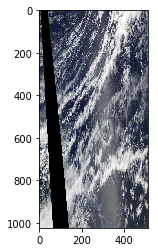

In [250]:
plt.imshow(x[0])

In [251]:
x.shape, y.shape

((4, 1024, 512, 3), (4, 1024, 512, 1))

In [179]:
%load_ext line_profiler

In [182]:
def time():
    for i in range(1000, 1010):
        x, y = train_gen.__getitem__(i)

In [183]:
%lprun -f train_gen.__getitem__ time()

In [114]:
train_gen.size

(1024, 512)

In [226]:
fn = SSDDIR + train_df['fn'].iloc[2]

In [239]:
img  = img_to_array(load_img(fn)) / 255.

In [240]:
img.shape

(1400, 2100, 3)

In [241]:
img

array([[[0.28627452, 0.3019608 , 0.34509805],
        [0.25490198, 0.27058825, 0.3137255 ],
        [0.25490198, 0.26666668, 0.3019608 ],
        ...,
        [0.25882354, 0.27058825, 0.29803923],
        [0.2627451 , 0.27450982, 0.3019608 ],
        [0.26666668, 0.2784314 , 0.30588236]],

       [[0.24313726, 0.25882354, 0.3019608 ],
        [0.25490198, 0.27058825, 0.3137255 ],
        [0.24705882, 0.2627451 , 0.29803923],
        ...,
        [0.25882354, 0.27058825, 0.29803923],
        [0.2627451 , 0.27450982, 0.3019608 ],
        [0.26666668, 0.2784314 , 0.30588236]],

       [[0.31764707, 0.33333334, 0.3764706 ],
        [0.27450982, 0.2901961 , 0.33333334],
        [0.2901961 , 0.30588236, 0.34117648],
        ...,
        [0.25882354, 0.27058825, 0.29803923],
        [0.2627451 , 0.27450982, 0.3019608 ],
        [0.26666668, 0.2784314 , 0.30588236]],

       ...,

       [[0.58431375, 0.6039216 , 0.6156863 ],
        [0.6       , 0.61960787, 0.6313726 ],
        [0.62352943, 0

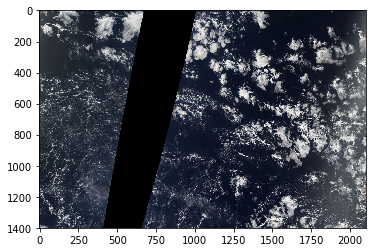

In [242]:
plt.imshow(img)

In [155]:
img = Image.open(fn)

AttributeError: 'PngImageFile' object has no attribute 'astype'

In [146]:
img.max()

0

In [148]:
img.shape

(1400, 2100, 3)

In [159]:
img.shape

(1400, 2100)

In [160]:
cv2.resize(img, (1024, 512)).shape

error: OpenCV(3.4.4) ../modules/imgproc/src/resize.cpp:3662: error: (-215:Assertion failed) func != 0 in function 'resize'


In [126]:
x.shape

(4, 512, 1024, 3)

In [136]:
y.shape

(4, 512, 1024, 3)

In [137]:
y

array([[[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        ...,

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]],


       [[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0,

## Unet - tf.keras

In [66]:
import tensorflow as tf
from tensorflow.keras.layers import *

In [74]:
def build_model(n_out=5, size=np.array([2100, 1400])//4): 
    # Build U-Net model
    inputs = Input((size[0], size[1], 3))

    c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (inputs)
    c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
    p1 = MaxPooling2D((2, 2)) (c1)

    c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
    c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
    p2 = MaxPooling2D((2, 2)) (c2)

    c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
    c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
    p3 = MaxPooling2D((2, 2)) (c3)

    c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
    c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

    c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

    u6 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

    u7 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
    c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

    u8 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
    c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

    u9 = Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
    c9 = Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

    outputs = Conv2D(n_out, (1, 1), activation='softmax') (c9)

    model = tf.keras.models.Model(inputs=[inputs], outputs=[outputs])
    return model

In [252]:
model = build_model(size = [1024, 512])

In [253]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 1024, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_196 (Conv2D)             (None, 1024, 512, 8) 224         input_15[0][0]                   
__________________________________________________________________________________________________
conv2d_197 (Conv2D)             (None, 1024, 512, 8) 584         conv2d_196[0][0]                 
__________________________________________________________________________________________________
max_pooling2d_56 (MaxPooling2D) (None, 512, 256, 8)  0           conv2d_197[0][0]                 
__________________________________________________________________________________________________
conv2d_198

In [254]:
model.compile('adam', loss='sparse_categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
model.fit_generator(train_gen, use_multiprocessing=True, workers=8)

Epoch 1/1
3524/6052 [================>.............] - ETA: 12:10 - loss: 3.5977 - acc: 0.7423

In [256]:
preds = model.predict_on_batch(x)

In [257]:
preds.shape

(4, 1024, 512, 5)

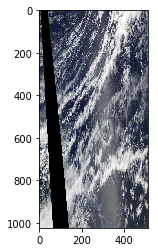

In [258]:
plt.imshow(x[0])

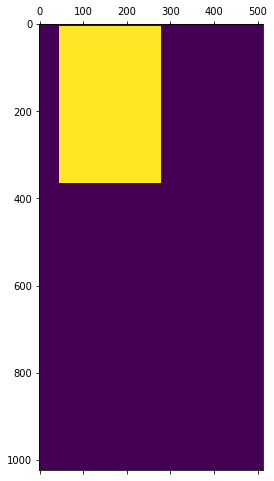

In [261]:
plt.matshow(y[0, :, :, 0])

In [268]:
y.mean((0, 1, 2, ))

array([0.7134714 , 0.06911322, 0.0874304 , 0.06026457, 0.06733176],
      dtype=float32)

In [78]:
2100/1400 

1.5

In [85]:
1024 / 1.5

682.6666666666666